In this **comparative study**, we will perform a linear regression to predict the value of the claim

In [1]:
# Step 1: Retrieve a dataset from a CSV Excel file

import pandas as pd # Allow us to work with CSV files. 

# Print the CE802_P3_Data.csv dataset with only 2 decimal digits and highlight missing values such as "nan"
pd.set_option("display.max_rows", None, "display.max_columns", None) # Print the entire Pandas dataframe (All the 1500 Rows)

dataset = pd.read_csv(r'C:\Users\Julio\Documents\RESPALDO\Tareas\University of Essex\Machine Learning\Assignment\CE802_P3_Data.csv')
print ('\nCE802_P3_Data.csv dataset:')
def conditional_formatter(value):
    return "{:.2f}".format(value) if not isinstance(value, str) else value
dataset.applymap(conditional_formatter) # Output: One dataset with only 2 decimal digits for those columns that are not categorical

# r'Paste here the whole path where the CE802_P3_Data.csv file has been saved'
# r'' indicates a raw string


CE802_P3_Data.csv dataset:


,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15,F16,Target
0,11.85,-258.09,-6.95,2557.29,Low,Europe,7.59,-28.22,-259.22,-1578.12,-141.76,9.00,6.00,20.19,169.26,1.64,999.41
1,11.99,-169.71,-16.06,2862.87,Low,Rest,2.57,-13.76,-321.80,-1914.16,-165.83,6.00,6.00,9.51,6259.05,0.08,0.00
2,3.48,-317.76,-8.14,2175.81,Medium,UK,1.60,-32.76,-253.54,457.12,-203.87,15.00,10.00,7.02,38504.82,6.40,266.29
3,14.75,-394.26,-5.61,1927.86,Low,UK,7.33,-13.42,-149.86,-1972.04,-145.52,6.00,10.00,33.99,20883.90,21.98,598.77
4,10.25,-365.46,-10.33,3187.98,High,USA,4.37,-32.66,-224.58,-2022.36,-153.94,12.00,10.00,4.29,12095.91,2167.48,396.90
5,13.53,-335.79,-8.29,2206.65,Low,UK,5.02,-23.20,-207.38,-631.46,-146.87,6.00,12.00,4.47,3531.39,2.36,0.00
6,18.28,-242.46,-8.14,1817.07,Medium,UK,6.96,-20.48,-185.98,-1308.30,-166.39,24.00,6.00,8.25,-2423.37,396.24,355.64
7,13.77,-582.57,-4.37,1646.94,Very low,Europe,2.21,-22.24,-171.54,-737.90,-161.10,24.00,12.00,4.02,-16962.81,0.00,1909.21
8,9.45,-321.60,-11.06,2814.78,Very low,USA,2.66,-24.46,-189.42,-1348.38,-261.51,18.00,10.00,17.19,-19361.13,175.08,377.30
9,7.81,-316.11,-3.08,2180.73,High,USA,4.44,-15.14,-206.50,-700.46,7.07,12.00,10.00,7.56,8019.27,853.40,561.66



Scatterplots (Target vs Feature):



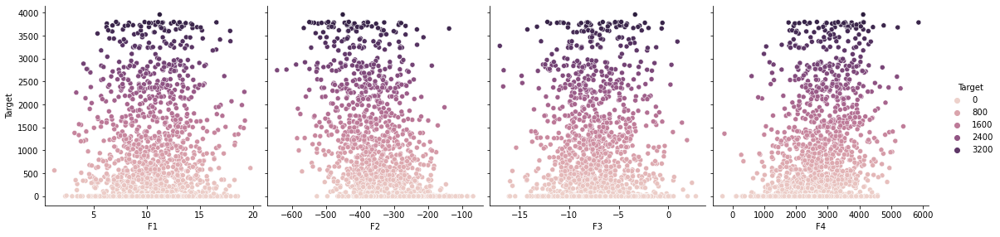

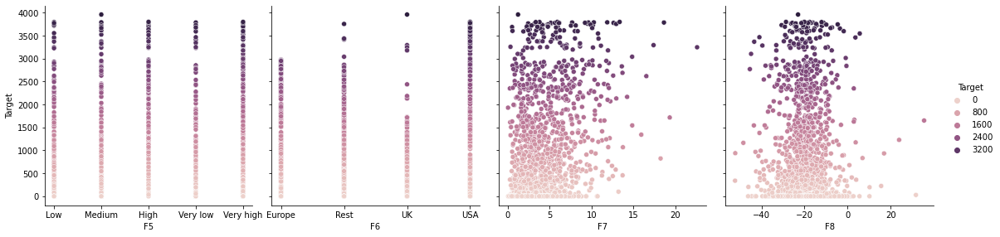

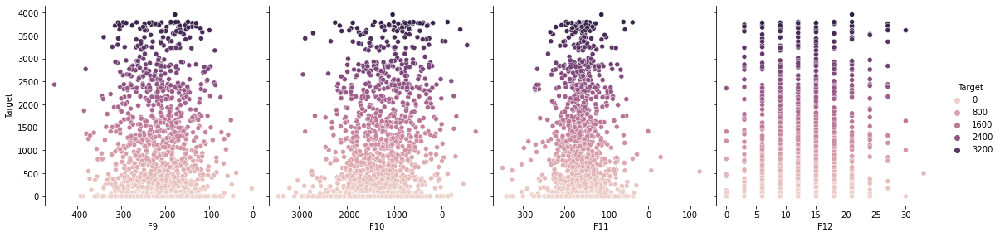

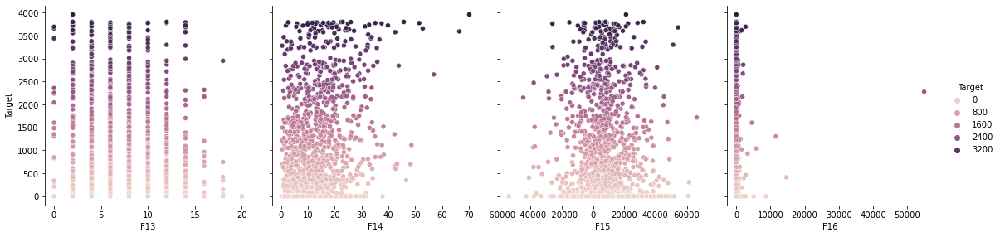

In [2]:
# Perform an Exploratory Data Analysis (EDA) to figure out what the data can tell us (Part 1)

# Creating scatterplots
import seaborn as sns # Import Seaborn visualization library
print ('\nScatterplots (Target vs Feature):\n')
scatterplot_1_4 = sns.pairplot(data=dataset,
                             y_vars=['Target'],
                             x_vars=['F1','F2','F3','F4'], 
                             hue = 'Target', height=4) # Output: Scatterplot Target vs F1, Target vs F2, Target vs F3 and Target vs F4

scatterplot_5_8 = sns.pairplot(data=dataset,
                             y_vars=['Target'],
                             x_vars=['F5','F6','F7','F8'], 
                             hue = 'Target', height=4) # Output: Scatterplot Target vs F5, Target vs F6, Target vs F7 and Target vs F8

scatterplot_9_12 = sns.pairplot(data=dataset,
                             y_vars=['Target'],
                             x_vars=['F9','F10','F11','F12'], 
                             hue = 'Target', height=4) # Output: Scatterplot Target vs F9, Target vs F10, Target vs F11 and Target vs F12

scatterplot_13_16 = sns.pairplot(data=dataset,
                             y_vars=['Target'],
                             x_vars=['F13','F14','F15','F16'], 
                             hue = 'Target', height=4) # Output: Scatterplot Target vs F13, Target vs F14, Target vs F15 and Target vs F16

# Uncomment the following lines if you want to see just 1 scatterplot. Then, modify the feature name by the one you wish to see

#import matplotlib.pyplot as plt
#%matplotlib inline
#dataset.plot(x='F9', y='Target', style='o')
#plt.title('Target vs F1')
#plt.xlabel('F1')
#plt.ylabel('Target')
#plt.show()

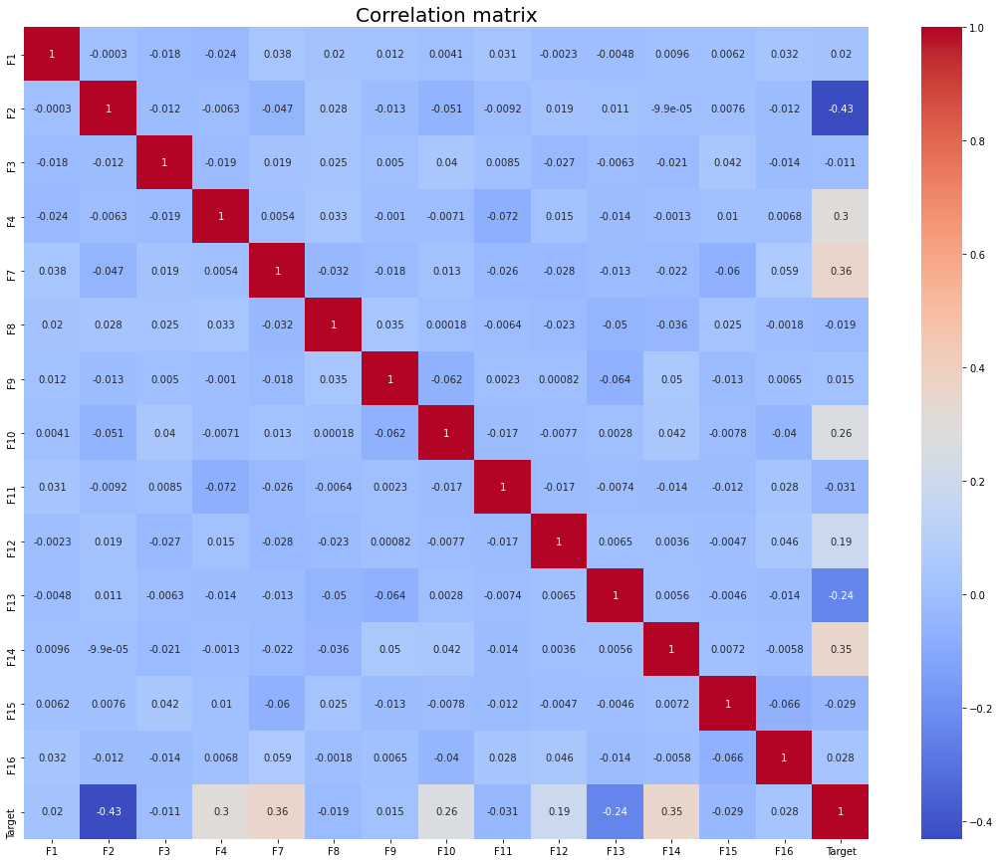

In [3]:
# Perform an Exploratory Data Analysis (EDA) to figure out what the data can tell us (Part 2)

# Creating the correlation matrix
import matplotlib.pyplot as plt # Allow us to graph the Correlation matrix
%matplotlib inline 
plt.figure(figsize=(19, 15)) # Change the Size of the graph
sns.heatmap(dataset.corr(),cmap='coolwarm', annot=True)
plt.title('Correlation matrix', fontsize=20) # Add a title
plt.show() # Output: Correlation matrix

 **Results interpretations**
 
 From the above analysis, we can observe that features <font color='blue'>**F1**</font> (0.02), <font color='blue'>**F3**</font> (-0.011), <font color='blue'>**F8**</font> (-0.019), <font color='blue'>**F9**</font> (0.015), <font color='blue'>**F11**</font> (-0.031), <font color='blue'>**F15**</font> (-0.029) and <font color='blue'>**F16**</font> (0.028) have cero correlation with the target.<br>
In other words, we we can see that many of the coefficients are 0, meaning that these features should not be used in the model, since they don't have a relationship with the target.
 
 ##### Measuring Correlation
|Absolute value of r|Description|
|:--|:-------------------------------|
|r < 0.3|None or very week correlation|
|0.3 < r < 0.5|Weak correlation|
|0.5 < r < 0.7|Moderate correlation|
|r > 0.7|Strong correlation|

<font size="2">Source: Adapted from Moore, D. S., Notz, W. I, & Flinger, M. A. (2013). The basic practice of statistics (6th
ed.). New York, NY: W. H. Freeman and Company.</font>

In [4]:
# Step 3: Feature engineering (Part 3)

# Dropping features that are useless 
dataset_dropf = dataset.drop(columns=['F1','F3','F8','F9','F11','F15','F16']) # Drop columns by their name
print ('\nCE802_P3_Data.csv dataset after dropping insignificant features:')
dataset_dropf # Output: CE802_P2_Data.csv dataset after dropping insignificant features


CE802_P3_Data.csv dataset after dropping insignificant features:


,F2,F4,F5,F6,F7,F10,F12,F13,F14,Target
0,-258.09,2557.29,Low,Europe,7.59,-1578.12,9,6,20.19,999.41
1,-169.71,2862.87,Low,Rest,2.57,-1914.16,6,6,9.51,0.00
2,-317.76,2175.81,Medium,UK,1.60,457.12,15,10,7.02,266.29
3,-394.26,1927.86,Low,UK,7.33,-1972.04,6,10,33.99,598.77
4,-365.46,3187.98,High,USA,4.37,-2022.36,12,10,4.29,396.90
5,-335.79,2206.65,Low,UK,5.02,-631.46,6,12,4.47,0.00
6,-242.46,1817.07,Medium,UK,6.96,-1308.30,24,6,8.25,355.64
7,-582.57,1646.94,Very low,Europe,2.21,-737.90,24,12,4.02,1909.21
8,-321.60,2814.78,Very low,USA,2.66,-1348.38,18,10,17.19,377.30
9,-316.11,2180.73,High,USA,4.44,-700.46,12,10,7.56,561.66


In [5]:
# Step 4: Handling categorical data

# Performing one-hot encoding to categorical data. 
dataset_dropf_hotenc = pd.get_dummies(dataset_dropf) # Transforming categorical data
print ('\nCE802_P3_Data.csv dataset after dropping insignificant features and applying one-hot encoding to categorical data:')
dataset_dropf_hotenc # Output: CE802_P2_Data.csv dataset after dropping insignificant features and applying one-hot encoding

# Categorical Data: According to Zuccarelli (2020), "It is simply information aggregated into groups rather than 
#                   being in numeric formats; such as gender, sex or education level".
# One-hot encoding: According to Zuccarelli (2020), "It is the most common and correct way to deal with non-ordinal 
#                   categorical data. It consists of creating an additional feature for each group of the categorical
#                   feature and mark each observations belonging (value=1) or not (value=0) to that group".


CE802_P3_Data.csv dataset after dropping insignificant features and applying one-hot encoding to categorical data:


,F2,F4,F7,F10,F12,F13,F14,Target,F5_High,F5_Low,F5_Medium,F5_Very high,F5_Very low,F6_Europe,F6_Rest,F6_UK,F6_USA
0,-258.09,2557.29,7.59,-1578.12,9,6,20.19,999.41,0,1,0,0,0,1,0,0,0
1,-169.71,2862.87,2.57,-1914.16,6,6,9.51,0.00,0,1,0,0,0,0,1,0,0
2,-317.76,2175.81,1.60,457.12,15,10,7.02,266.29,0,0,1,0,0,0,0,1,0
3,-394.26,1927.86,7.33,-1972.04,6,10,33.99,598.77,0,1,0,0,0,0,0,1,0
4,-365.46,3187.98,4.37,-2022.36,12,10,4.29,396.90,1,0,0,0,0,0,0,0,1
5,-335.79,2206.65,5.02,-631.46,6,12,4.47,0.00,0,1,0,0,0,0,0,1,0
6,-242.46,1817.07,6.96,-1308.30,24,6,8.25,355.64,0,0,1,0,0,0,0,1,0
7,-582.57,1646.94,2.21,-737.90,24,12,4.02,1909.21,0,0,0,0,1,1,0,0,0
8,-321.60,2814.78,2.66,-1348.38,18,10,17.19,377.30,0,0,0,0,1,0,0,0,1
9,-316.11,2180.73,4.44,-700.46,12,10,7.56,561.66,1,0,0,0,0,0,0,0,1


In [6]:
# Step 5: Split the dataset into training set and testing set (Part 1)

# Randomising the dataset after dropping insignificant features and applying one-hot encoding to categorical data
from sklearn.utils import shuffle # Allow us to arrange all the records in random order (rows)
dataset_dropf_hotenc_rand= shuffle(dataset_dropf_hotenc)
dataset_dropf_hotenc_rand.style.format("{:.2f}") \
                         .set_caption("Randomised CE802_P3_Data.csv dataset after dropping insignificant features and applying one-hot encoding to categorical data")
# Print a Random CE802_P3_Data.csv dataset after dropping insignificant features and applying one-hot encoding to categorical data

,F2,F4,F7,F10,F12,F13,F14,Target,F5_High,F5_Low,F5_Medium,F5_Very high,F5_Very low,F6_Europe,F6_Rest,F6_UK,F6_USA
1307,-291.15,1977.69,4.30,-2344.72,18.00,4.00,2.76,214.25,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00
74,-282.90,2440.02,3.71,-1713.30,15.00,4.00,24.69,2031.42,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00
1081,-425.01,5050.35,3.87,-2871.62,15.00,4.00,3.42,1409.13,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00
157,-354.27,935.55,5.13,-321.42,12.00,4.00,12.42,749.75,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00
206,-161.07,3399.60,5.69,-2353.54,18.00,8.00,10.95,164.72,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00
581,-351.72,3475.74,7.55,-1520.74,12.00,2.00,9.36,1657.03,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00
633,-390.15,2307.00,5.85,-738.14,12.00,12.00,2.01,584.26,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00
244,-306.96,1819.08,2.68,-1691.12,12.00,6.00,8.37,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00
1464,-417.84,4286.55,2.10,-1537.16,12.00,6.00,4.53,1228.06,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00
126,-181.08,3147.03,0.86,-1810.16,12.00,6.00,10.08,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00


In [7]:
# Step 5: Split the dataset into training set and testing set (Part 2)

# Transfering the data into 2 numpy arrays
import numpy as np # Allow us to work with arrays
np.set_printoptions(threshold=np.inf, precision=2, suppress=True, linewidth=170) # Print all the values of an array as a pretty table (all values in one row)

x = dataset_dropf_hotenc_rand.loc[:, dataset_dropf_hotenc_rand.columns != 'Target'].to_numpy() # This array contains all the feature variable values.
y = dataset_dropf_hotenc_rand.loc[:, 'Target'].to_numpy() # This array contains ONLY the target variable values.
print('\n'+'\033[1m'+'Array of feature variables:'+'\033[0m', x.shape) 
print(x) # Output: All possible elements of the array. (This includes all the values of the features with the exception of column "Target" from dataset: "dataset_dropf_hotenc_rand")

np.set_printoptions(threshold=np.inf, precision=2, suppress=True, linewidth=5) # Print all the values of an array vertically (one value in one row) 
print('\n'+'\033[1m'+'Array of target variable:'+'\033[0m', y.shape)
print(y) # Output: All possible elements of the array. (This includes only values of "Target" feature from dataset: "dataset_dropf_hotenc_rand")

# Code '\033[1m' and '\033[0m' allow to print a string in bold.


Array of feature variables: (1500, 16)
[[ -291.15  1977.69     4.3  -2344.72    18.       4.       2.76     0.       0.       0.       1.       0.       0.       0.       0.       1.  ]
 [ -282.9   2440.02     3.71 -1713.3     15.       4.      24.69     0.       0.       1.       0.       0.       0.       0.       0.       1.  ]
 [ -425.01  5050.35     3.87 -2871.62    15.       4.       3.42     0.       0.       1.       0.       0.       0.       1.       0.       0.  ]
 [ -354.27   935.55     5.13  -321.42    12.       4.      12.42     0.       0.       0.       0.       1.       1.       0.       0.       0.  ]
 [ -161.07  3399.6      5.69 -2353.54    18.       8.      10.95     1.       0.       0.       0.       0.       0.       1.       0.       0.  ]
 [ -351.72  3475.74     7.55 -1520.74    12.       2.       9.36     0.       1.       0.       0.       0.       0.       1.       0.       0.  ]
 [ -390.15  2307.       5.85  -738.14    12.      12.       2.01     0.       

In [8]:
# Step 5: Split the dataset into training set and testing set (Part 3)

# Splitting the dataset "dataset_dropf_hotenc_rand" into training Set (70% of the rows) and testing set (30% of the rows)
from sklearn.model_selection import train_test_split # Import train_test_split function
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.3, random_state=1)

X_train_lenght = len(X_train) # Output: How many samples does the training feature variables set contain
Y_train_lenght = len(Y_train) # Output: How many samples does the training target variable set contain

X_test_lenght = len(X_test)  # Output: How many samples does the testing feature variables set contain
Y_test_lenght = len(Y_test)  # Output: How many samples does the testing target variable set contain

print ('''\nAccording to Dangeti (2017), "in practice, data usually will be split randomly 70:30 into train and test
datasets respectively in statistical modeling"\n''')

np.set_printoptions(threshold=np.inf, precision=2, suppress=True, linewidth=130) # Print all the values of an array as a pretty table (all values in one row)
print ('For the previous reason, the '+'\033[1m'+'training set for the feature variables '+'\033[0m'+ 'will contain '+'\033[1m'+'%s samples.' %(X_train_lenght)+'\033[0m')
# Uncomment the following line to see the whole training dataset for the feature variables (X)
#print (X_train)
print ('For the previous reason, the '+'\033[1m'+'training set for the target variable '+'\033[0m'+ 'will contain '+'\033[1m'+'%s samples.' %(Y_train_lenght)+'\033[0m'+'\n')
# Uncomment the following line to see the whole training dataset for the target variable (Y)
#print (Y_train)
print ('For the previous reason, the '+'\033[1m'+'testing set for the feature variables '+'\033[0m'+ 'will contain '+'\033[1m'+'%s samples.' %(X_test_lenght)+'\033[0m')
# Uncomment the following line to see the whole testing dataset for the feature variables (X)
#print (X_test)
print ('For the previous reason, the '+'\033[1m'+'testing set for the target variable '+'\033[0m'+ 'will contain '+'\033[1m'+'%s samples.' %(Y_test_lenght)+'\033[0m')
# Uncomment the following line to see the whole testing dataset for the target variable (Y)
#print (Y_test)

# Code '\033[1m' and '\033[0m' allow to print a string in bold.


According to Dangeti (2017), "in practice, data usually will be split randomly 70:30 into train and test
datasets respectively in statistical modeling"

For the previous reason, the training set for the feature variables will contain 1050 samples.
For the previous reason, the training set for the target variable will contain 1050 samples.

For the previous reason, the testing set for the feature variables will contain 450 samples.
For the previous reason, the testing set for the target variable will contain 450 samples.


In [9]:
# Step 6: Build the linear regression (Part 1)

# Create the linear regression object
from sklearn.linear_model import LinearRegression # Import linear regression
lregr = LinearRegression() # Linear regression model

print ("Linear regression object has been created succesfully")

Linear regression object has been created succesfully


In [10]:
# Step 6: Build the linear regression (Part 2)

# Training the linear regression object
lregr.fit(X_train, Y_train) # linear regression model

# Creating a function to make predictions based on any model
np.set_printoptions(threshold=np.inf, precision=3, suppress=True, linewidth=130) # Print all the values of an array horizontally 

def model_prediction(X_test, model):    
    Y_pred = model.predict(X_test)     
    print("Predicted values:")  
    print(Y_pred)
    return Y_pred 

# Create a function to calculate the linear regression metrics
from sklearn import metrics # Import scikit-learn metrics module for most common linear regression metrics
from sklearn.metrics import r2_score # Import scikit-learn.metrics module for r2 score (Coefficient of Determination)
def model_evaluation(Y_test, Y_pred): 
    print('\nMean Absolute Error: %s'%(metrics.mean_absolute_error(Y_test, Y_pred))+'''
Mean Squared Error: %s'''%(metrics.mean_squared_error(Y_test, Y_pred))+'''
Root Mean Squared Error: %s'''%(np.sqrt(metrics.mean_squared_error(Y_test, Y_pred)))+'''
R\u00b2 Score: %s'''%(r2_score(Y_test, Y_pred)))
    
print ('''\n1. Linear regression object has been trained succesfully.
2. Functions have been created succesfully''')


1. Linear regression object has been trained succesfully.
2. Functions have been created succesfully


In [11]:
# Step 7: Evaluate the performance of the linear regression (Part 1)

# Predictions using linear regression 
print('\033[1m'+'\nEvaluation results using linear regression:\n'+'\033[0m') 
Y_pred_lregr =  model_prediction(X_test, lregr) # Output: Predicted values
model_evaluation(Y_test, Y_pred_lregr) # Output: MAE metric, MSE metric, RMSE metric and R2 metric
accuracy = lregr.score(X_train,Y_train)
print('Model accuracy: %s'%(accuracy)+'\n') #Output: r_score metric
print('Linear regression equation: ') 
 
for i,j in zip(dataset.columns, lregr.coef_):
    print("{0:+g}".format(j)+"("+i+")",end=" ")
print("{0:+g}".format(lregr.intercept_)) # Output: Intercept Value calculation and Feature coefficients calculation

# "{0:+g}".format   Add a plus sign (+) or negative sign (-) depending of the number nature.
# end=" "           Print "for loops" horizontally


Evaluation results using linear regression:

Predicted values:
[ 1441.985   357.561  1321.796  2212.6    1227.227  1679.843   283.772  1387.983   586.235  1064.02    -83.117  -460.307
  1778.409  -410.356   356.412   506.082  1773.92      2.754   544.692  2801.948   709.495   811.25   1977.671  -232.424
  2234.43   2275.482   470.349   530.056   588.6     560.542  1143.679   737.068   701.636  -257.579   604.138  1608.62
  1418.293  2382.085   -10.34    757.166  2898.564   519.449   419.487   670.682  1502.235  -710.883  3198.478  -548.643
   568.685  -214.876   432.213    41.012  1912.695  2360.697    31.766  -744.412  1184.252   870.568  1281.057   410.657
   579.606   708.621  1267.97   -474.446   929.916   811.499  -303.83    818.51    594.258  -171.833  -124.625  1662.562
  -413.02    342.799  1457.921   870.782    89.428   768.389  1041.095   760.926   885.576  2441.105  -245.962   359.361
  2549.553   874.296   320.574   870.568  1910.25   1169.086  1169.771  1970.546   733.076

In [12]:
# Step 7: Evaluate the performance of the linear regression (Part 2)

# Result interpretations

print('\n'+'\033[1m'+'Result interpretations'+'\033[0m')

print('\n'+'\033[1m'+'Intercept Value'+'\033[0m') # Beginning of intercept value interpretations
print ('''\nThe intercept (often labeled the constant) is the expected mean value of Y when all X are zero (X=0).
Unfortunately, it's frequently impossible to set all variables to zero because this combination can be an impossible 
or irrational arrangement. 

In this case, we see that the intercept value is %s.'''%("{:.4f}".format(lregr.intercept_))+'''
If all the features variables are zero, the regression equation will predict a target value equal to %s'''%("{:.4f}".format(lregr.intercept_)))


print('\n'+'\033[1m'+'Feature Coefficients'+'\033[0m') # Beginning of feature coefficients interpretations

print ('''\nThe sign of each coefficient indicates the direction of the relationship between a predictor variable (F1,..,F16) 
and the response variable (Target).
   • A positive sign indicates that as the predictor variable increases, the Target variable also increases.
   • A negative sign indicates that as the predictor variable increases, the Target variable decreases.
   
In this case, if the manager wants to increase the value of the Column "Target", he/she must develop strategies that
aim to increase also features F11 or F16, for example. 
Additionally, the manager can also focus on decreasing features F9 or F15 to increment the target value.

Similarly, the equation of linear regression can be explained as the following:
   •For every one unit of change in F1 feature, the change in the score is about 4.78%.
   •For every one unit of change in F3 feature, the change in the score is about 136.282%.''')


print('\n'+'\033[1m'+'R\u00b2 Score'+'\033[0m') # Beginning of R2 Score interpretations
print ('''\nThis value specifies the amount of the residual across the whole dataset. 

In this case, it can be referred that %s '''%("{:.0%}".format(r2_score(Y_test, Y_pred_lregr)))+'''of the changeability of the dependent output attribute can be explained 
by the model, while the remaining %s'''%("{:.0%}".format(1-r2_score(Y_test, Y_pred_lregr)))+''' of the variability is still unaccounted for.''')


print('\n'+'\033[1m'+'R Score'+'\033[0m') # Beginning of R score interpretations
print ('''\nThis value is simply the number of correct predictions divided by the total number of predictions. (Model accuracy) 

In this case, our model has correctly predicted %s'''%"{:.0%}".format(lregr.score(X_train,Y_train))+''' of the target values''')

print('\n'+'\033[1m'+'Mean Absolute Error (MAE)'+'\033[0m') # Beginning of MAE interpretations
print('''\nMAE is the absolute difference between the target value and the value predicted by the model. 

In this case, it means that on average our prediction was %s'''%"{:.3f}".format((metrics.mean_absolute_error(Y_test, Y_pred_lregr)))+''' away from the true prediction''') 


print('\n'+'\033[1m'+'Mean Squared Error (MSE)'+'\033[0m') # Beginning of MSE interpretations
print('''MSE is one of the most preferred metrics for regression tasks. It is simply the average of the squared difference
between the target value and the value predicted by the regression model''')
 
    
print('\n'+'\033[1m'+'Root Mean Squared Error (RMSE)'+'\033[0m') # Beginning of RMSE interpretations
print('''RMSE is the most widely used metric for regression tasks and is the square root of the averaged squared difference 
between the target value and the value predicted by the model.''')
print ('\nIn this case, we can observe that the value of RMSE is %s'%("{:.3f}".format(np.sqrt(metrics.mean_squared_error(Y_test, Y_pred_lregr))))+''', which is more than 10% of the mean value
of column "Target" ('''+'%s'%("{:.3f}".format(dataset["Target"].mean()/10))+')')

df_mean = pd.DataFrame({"Mean value of the column Target":[dataset["Target"].mean()], # Mean Calculation of column "Target"
                        "RSME":[np.sqrt(metrics.mean_squared_error(Y_test, Y_pred_lregr))], # RMSE calculation
                        "10% of Target mean":[dataset["Target"].mean()/10]}) # Calculation of the 10% of the "Target" column mean
display(df_mean.style.set_properties(**{'text-align': 'center'})) # Output: One table that compares Target mean vs RMSE

print('''\nTo Sum up, our algorithm was not very accurate but can still make reasonably good predictions.
This not too bad if we consider that anything over 50% means the model is better than random. However, we should consider
applying different ML algorithgms in order to improve the accuracy of the model''') # Final conclusion


Result interpretations

Intercept Value

The intercept (often labeled the constant) is the expected mean value of Y when all X are zero (X=0).
Unfortunately, it's frequently impossible to set all variables to zero because this combination can be an impossible 
or irrational arrangement. 

In this case, we see that the intercept value is -2008.2097.
If all the features variables are zero, the regression equation will predict a target value equal to -2008.2097

Feature Coefficients

The sign of each coefficient indicates the direction of the relationship between a predictor variable (F1,..,F16) 
and the response variable (Target).
   • A positive sign indicates that as the predictor variable increases, the Target variable also increases.
   • A negative sign indicates that as the predictor variable increases, the Target variable decreases.
   
In this case, if the manager wants to increase the value of the Column "Target", he/she must develop strategies that
aim to increase also feature

,Mean value of the column Target,RSME,10% of Target mean
0,922.082533,508.526578,92.208253



To Sum up, our algorithm was not very accurate but can still make reasonably good predictions.
This not too bad if we consider that anything over 50% means the model is better than random. However, we should consider
applying different ML algorithgms in order to improve the accuracy of the model


In [13]:
# Step 7: Evaluate the performance of the linear regression (Part 3)

# Comparing real values vs predicted values with linear regression
print ('\nComparison table between real "Target" values vs predicted "Target" values:')
df1 = pd.DataFrame({'Real Value': Y_test, 'Predicted Value': Y_pred_lregr})
df1['Predicted Value'] = df1['Predicted Value'].apply(lambda x : x if x > 0 else 0) # Transform Negative numbers to 0 in column "Predicted Value"
df1["Residuals"] = df1["Real Value"] - df1['Predicted Value']
df1.style.set_properties(**{'text-align': 'center'}) # Output: "real vs predicted table"


Comparison table between real "Target" values vs predicted "Target" values:


,Real Value,Predicted Value,Residuals
0,977.690000,1441.985060,-464.295060
1,225.320000,357.560652,-132.240652
2,789.740000,1321.795679,-532.055679
3,3313.360000,2212.600007,1100.759993
4,831.170000,1227.227160,-396.057160
5,1862.980000,1679.843472,183.136528
6,0.000000,283.771899,-283.771899
7,957.840000,1387.982657,-430.142657
8,511.830000,586.234687,-74.404687
9,1051.990000,1064.020033,-12.030033



We can also visualize comparison results as a bar graph. 
Though our model is not very precise, the predicted Target values are close to the actual ones.



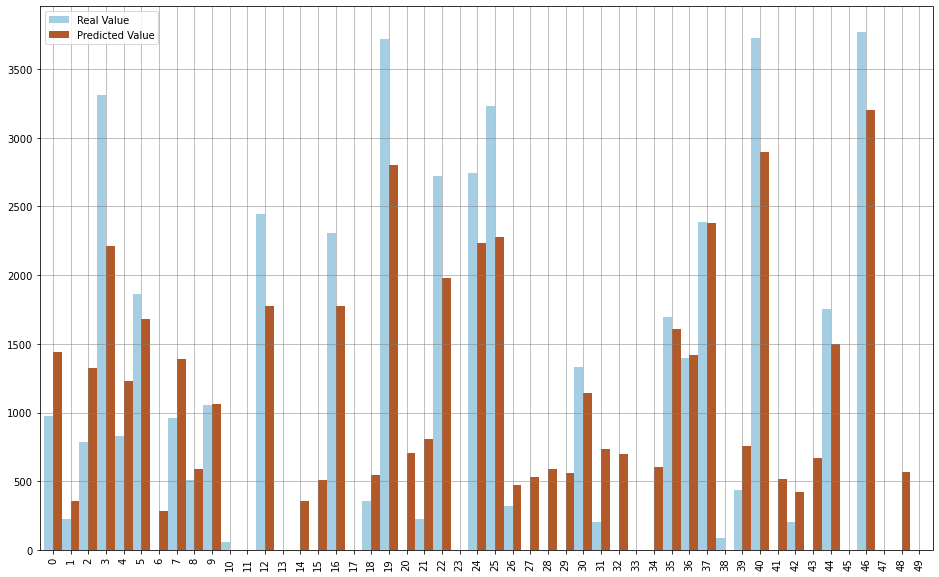

Note:
For representation purpose, I wil plot only 50 records. It won't be understandable if all the 450 samples are plotted.


In [14]:
# Step 7: Evaluate the performance of the linear regression (Part 4)

# Plotting real values vs predicted values with bar chart
print ('''\nWe can also visualize comparison results as a bar graph. 
Though our model is not very precise, the predicted Target values are close to the actual ones.
''')

df1_graph = df1[["Real Value","Predicted Value"]].head(50) # Show the first 50 rows
df1_graph.plot(kind='bar',figsize=(16,10), width=1, colormap='Paired') #Width=1   changes the width of the bars
plt.grid(which='major', linestyle='-', linewidth='0.5', color='gray')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

print('''Note:
For representation purpose, I wil plot only 50 records. It won't be understandable if all the 450 samples are plotted.''')


Linear regression graph:



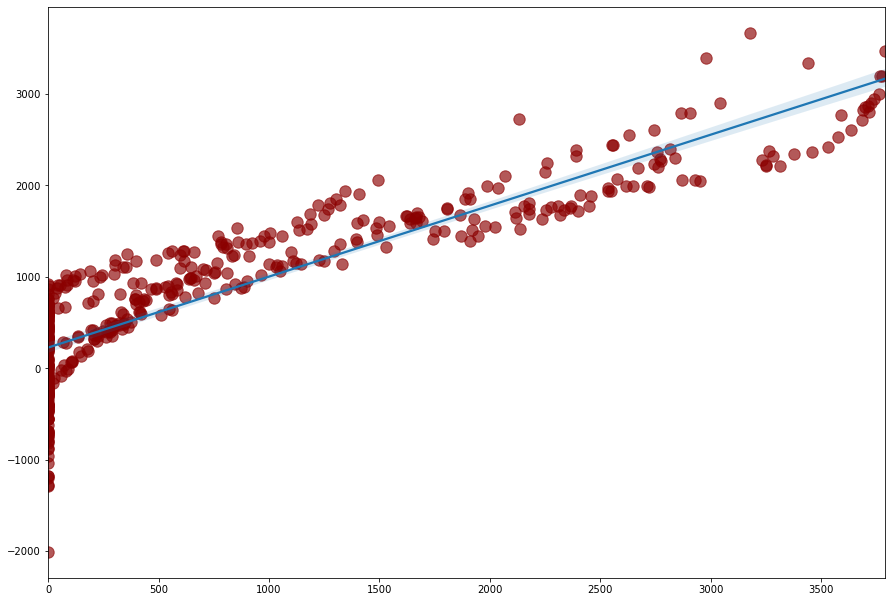

In [15]:
# Step 8: Print the Linear regression

# Printing the linear regression
import warnings
warnings.filterwarnings('ignore') # Allow to disable python warnings
import matplotlib.pyplot as plt # Allow to change the size of a figure

print ('\nLinear regression graph:\n')
regression_graph = sns.regplot(Y_test, Y_pred_lregr, fit_reg=True, scatter_kws={'color': 'darkred', 'alpha': 0.65, 's': 130})
regression_graph.figure.set_size_inches(15.0, 10.50) # Change the Size of the linear regression graph

#fig_reg=true        Plot the regression line
#'alpha': 0.65       Change the color transparency of the datapoints (Not transparent equals to 1, Transparent equals to  0)
#'s': 130            Change the Size of the datapoints 

**Notes**: 

1. The predictions change according to the datasets given. Remember these sets were randomised
2. The predictions change according to the train_test_split percentage.
3. The bias and variance in each dataset could have an impact in predictions.
4. To increase the accuracy, we can split the dataset into many smalls datasets, then create models, and again consolidate the results to get an optimum accuracy.

The following three factors may have contributed to the inaccuracy of a linear regression:

1. Need more data: 1,500 samples isn't that much, whereas having multiple data could have helped us improve the accuracy    quite a bit.
2. Bad assumptions: We made the assumption that this data has a linear relationship, but that might not be the case.   
3. Poor features: The features we used may not have had a high enough correlation to the values we were trying to predict.

In this **comparative study - Part 2**, we will perform 2 more **machine learning techniques** to predict the value of the claim:

1. **Random forest regressor** 
2. **Lasso regression**

In [16]:
# Step 1: Retrieve a dataset from a CSV Excel file (Done in cell 1)
# Step 2: Perform an Exploratory Data Analysis (EDA) to figure out what the data can tell us (Part 1) (Done in cell 2)
# Step 2: Perform an Exploratory Data Analysis (EDA) to figure out what the data can tell us (Part 2) (Done in cell 3)
# Step 3: Feature engineering (Done in cell 4)
# Step 4: Handling categorical data (Done in cell 5)
# Step 5: Split the dataset into training set and testing set (Part 1) (Done in cell 6)
# Step 5: Split the dataset into training set and testing set (Part 2) (Done in cell 7)
# Step 5: Split the dataset into training set and testing set (Part 3) (Done in cell 8)

# Step 6: Build the random forest regressor & lasso regression (Part 1)
    
# Creating the random forest regressor object
from sklearn.ensemble import RandomForestRegressor # Import random forest regressor
RFR = RandomForestRegressor(n_estimators = 100, random_state = 42, n_jobs=1, ) # Random forest regressor model

# Creating the lasso regression
from sklearn.linear_model import Lasso # Import Lasso regression
lasso = Lasso(alpha=0.01) # Lasso regression model

# Finding the optimal alpha value with gridsearch
from sklearn.model_selection import GridSearchCV # GridSearchCV performs hyperparameter tuning in order to determine the optimal values for a given model
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
param_grid = dict(alpha=alpha)
grid = GridSearchCV(estimator=lasso, param_grid=param_grid, scoring='r2', verbose=1, n_jobs=-1)
grid_result = grid.fit(X_train, Y_train)
print('Best score: ', grid_result.best_score_)
print('Best parameter: ', grid_result.best_params_)
### Best Score:  0.7838
### Best Parameter:  {'alpha': 0.01}

print ("\nRandom forest regressor & lasso regression objects have been created succesfully")

# n_estimators   This parameter is the number of trees that we want to build before taking the maximum voting 
#                or averages of predictions. Higher number of trees give us better performance but makes our code slower
# n_jobs         This parameter tells the engine how many processors is it allowed to use. 
#                A value of “-1” means there is no restriction whereas a value of “1” means it can only use one processor.
# random_state   This parameter makes a solution easy to replicate. A definite value of random_state will always produce 
#                same results if given with same parameters and training data
# verbose=1:     We can set this parameter to 1 to get the detailed print out while we fit the data to GridSearchCV
# scoring        This parameter provides the evaluation metric that we want to use
# params_grid:   This parameter tells the dictionary object that holds the hyperparameters we want to try

Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Best score:  0.7862080743264116
Best parameter:  {'alpha': 0.001}

Random forest regressor & lasso regression objects have been created succesfully


[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:   14.3s finished


In [17]:
# Step 6: Build the random forest regressor & lasso regression (Part 2)

# Train both random forest regresor and lasso regression
RFR = RFR.fit(X_train, Y_train) # Random forest regression model
lasso = lasso.fit(X_train, Y_train) # Lasso regression model

print ('''\n1. Random forest regressor and Lasso regression objects have been trained succesfully.
2. Functions have been created succesfully''')


1. Random forest regressor and Lasso regression objects have been trained succesfully.
2. Functions have been created succesfully


In [18]:
# Step 7: Evaluate the performance of the random forest regressor & lasso regression (Part 1)

# Predictions using random forest regressor 
print('\033[1m'+'\nEvaluation results using random forest regressor:\n'+'\033[0m') 
Y_pred_RFR =  model_prediction(X_test, RFR) # Output: Predicted values
model_evaluation(Y_test, Y_pred_RFR) # Output: MAE metric, MSE metric, RMSE metric and R2 metric
accuracy = RFR.score(X_train,Y_train)
print('Model accuracy: %s'%(accuracy)+'\n') #Output: r_score metric

# Predictions using lasso regression 
print('\033[1m'+'\nEvaluation results using lasso regression:\n'+'\033[0m') 
Y_pred_lasso =  model_prediction(X_test, lasso) # Output: Predicted values
model_evaluation(Y_test, Y_pred_lasso) # Output: MAE metric, MSE metric, RMSE metric and R2 metric
accuracy = lasso.score(X_train,Y_train)
print('Model accuracy: %s'%(accuracy)+'\n') #Output: r_score metric


Evaluation results using random forest regressor:

Predicted values:
[1237.192  687.765  490.894 2534.652 1161.641 1560.791  466.743 1318.945  776.208 1076.797  324.645  143.634 1488.981   88.908
   94.613  955.51  2028.943  226.13   671.514 2944.239  973.762  594.344 1667.379  552.968 2263.16  2924.349  811.302   84.921
  213.513  207.563  942.411  768.995  125.384   34.224  297.475 2227.681 1171.365 1465.692  658.269  461.674 3157.263  417.434
  891.641  433.854 2021.172   64.039 2815.787   62.159  169.825  139.832  881.623  487.067 1764.569 3037.943  163.747   94.873
 1287.758 1046.442  273.78   627.056   73.228  515.324 1233.055   83.078 1146.013  943.606  135.498  210.524  897.625    2.342
  281.549 1584.686  134.826 1115.207 1149.289  797.508  523.151  944.772  406.926  835.103  834.997 1819.204  572.649  473.174
 2111.522 1041.217  154.742  419.287 1387.59   773.69   934.99  1801.86   946.84    16.45  2488.983  337.243 1644.372  100.303
 1433.31  1730.941  676.376 1613.172    5

In [19]:
# Step 7: Evaluate the performance of the random forest regressor & lasso regression (Part 2)

# Result interpretations of random forest regressor

print('\n'+'\033[1m'+'Result interpretations of random forest regressor'+'\033[0m')

print('\n'+'\033[1m'+'R\u00b2 Score'+'\033[0m') # Beginning of R2 Score interpretations
print ('''\nThis value specifies the amount of the residual across the whole dataset. 

In this case, it can be referred that %s '''%("{:.0%}".format(r2_score(Y_test, Y_pred_RFR)))+'''of the changeability of the dependent output attribute can be explained 
by the model, while the remaining %s'''%("{:.0%}".format(1-r2_score(Y_test, Y_pred_RFR)))+''' of the variability is still unaccounted for.''')

print('\n'+'\033[1m'+'R Score'+'\033[0m') # Beginning of R score interpretations
print ('''\nThis value is simply the number of correct predictions divided by the total number of predictions. (Model accuracy) 

In this case, our model has correctly predicted %s'''%"{:.0%}".format(RFR.score(X_train,Y_train))+''' of the target values''')

print('\n'+'\033[1m'+'Mean Absolute Error (MAE)'+'\033[0m') # Beginning of MAE interpretations
print('''\nMAE is the absolute difference between the target value and the value predicted by the model. 

In this case, it means that on average our prediction was %s'''%"{:.3f}".format((metrics.mean_absolute_error(Y_test, Y_pred_RFR)))+''' away from the true prediction''') 


print('\n'+'\033[1m'+'Mean Squared Error (MSE)'+'\033[0m') # Beginning of MSE interpretations
print('''MSE is one of the most preferred metrics for regression tasks. It is simply the average of the squared difference
between the target value and the value predicted by the regression model''')
 
    
print('\n'+'\033[1m'+'Root Mean Squared Error (RMSE)'+'\033[0m') # Beginning of RMSE interpretations
print('''RMSE is the most widely used metric for regression tasks and is the square root of the averaged squared difference 
between the target value and the value predicted by the model.''')
print ('\nIn this case, we can observe that the value of RMSE is %s'%("{:.3f}".format(np.sqrt(metrics.mean_squared_error(Y_test, Y_pred_RFR))))+''', which is more than 10% of the mean value
of column "Target" ('''+'%s'%("{:.3f}".format(dataset["Target"].mean()/10))+')')

df_mean = pd.DataFrame({"Mean value of the column Target":[dataset["Target"].mean()], # Mean Calculation of column "Target"
                        "RSME":[np.sqrt(metrics.mean_squared_error(Y_test, Y_pred_RFR))], # RMSE calculation
                        "10% of Target mean":[dataset["Target"].mean()/10]}) # Calculation of the 10% of the "Target" column mean
display(df_mean.style.set_properties(**{'text-align': 'center'})) # Output: One table that compares Target mean vs RMSE

print('''\nTo Sum up, our algorithm was not very accurate but can still make reasonably good predictions.
This not too bad if we consider that anything over 50% means the model is better than random. However, we should consider
applying different ML algorithgms in order to improve the accuracy of the model''') # Final conclusion


Result interpretations of random forest regressor

R² Score

This value specifies the amount of the residual across the whole dataset. 

In this case, it can be referred that 74% of the changeability of the dependent output attribute can be explained 
by the model, while the remaining 26% of the variability is still unaccounted for.

R Score

This value is simply the number of correct predictions divided by the total number of predictions. (Model accuracy) 

In this case, our model has correctly predicted 96% of the target values

Mean Absolute Error (MAE)

MAE is the absolute difference between the target value and the value predicted by the model. 

In this case, it means that on average our prediction was 409.922 away from the true prediction

Mean Squared Error (MSE)
MSE is one of the most preferred metrics for regression tasks. It is simply the average of the squared difference
between the target value and the value predicted by the regression model

Root Mean Squared Error (RMSE

,Mean value of the column Target,RSME,10% of Target mean
0,922.082533,540.040202,92.208253



To Sum up, our algorithm was not very accurate but can still make reasonably good predictions.
This not too bad if we consider that anything over 50% means the model is better than random. However, we should consider
applying different ML algorithgms in order to improve the accuracy of the model


In [20]:
# Step 7: Evaluate the performance of the random forest regressor & lasso regression (Part 3)

# Result interpretations of lasso regression

print('\n'+'\033[1m'+'Result interpretations of lasso regression'+'\033[0m')

print('\n'+'\033[1m'+'R\u00b2 Score'+'\033[0m') # Beginning of R2 Score interpretations
print ('''\nThis value specifies the amount of the residual across the whole dataset. 

In this case, it can be referred that %s '''%("{:.0%}".format(r2_score(Y_test, Y_pred_lasso)))+'''of the changeability of the dependent output attribute can be explained 
by the model, while the remaining %s'''%("{:.0%}".format(1-r2_score(Y_test, Y_pred_lasso)))+''' of the variability is still unaccounted for.''')

print('\n'+'\033[1m'+'R Score'+'\033[0m') # Beginning of R score interpretations
print ('''\nThis value is simply the number of correct predictions divided by the total number of predictions. (Model accuracy) 

In this case, our model has correctly predicted %s'''%"{:.0%}".format(lasso.score(X_train,Y_train))+''' of the target values''')

print('\n'+'\033[1m'+'Mean Absolute Error (MAE)'+'\033[0m') # Beginning of MAE interpretations
print('''\nMAE is the absolute difference between the target value and the value predicted by the model. 

In this case, it means that on average our prediction was %s'''%"{:.3f}".format((metrics.mean_absolute_error(Y_test, Y_pred_lasso)))+''' away from the true prediction''') 


print('\n'+'\033[1m'+'Mean Squared Error (MSE)'+'\033[0m') # Beginning of MSE interpretations
print('''MSE is one of the most preferred metrics for regression tasks. It is simply the average of the squared difference
between the target value and the value predicted by the regression model''')
 
    
print('\n'+'\033[1m'+'Root Mean Squared Error (RMSE)'+'\033[0m') # Beginning of RMSE interpretations
print('''RMSE is the most widely used metric for regression tasks and is the square root of the averaged squared difference 
between the target value and the value predicted by the model.''')
print ('\nIn this case, we can observe that the value of RMSE is %s'%("{:.3f}".format(np.sqrt(metrics.mean_squared_error(Y_test, Y_pred_lasso))))+''', which is more than 10% of the mean value
of column "Target" ('''+'%s'%("{:.3f}".format(dataset["Target"].mean()/10))+')')

df_mean = pd.DataFrame({"Mean value of the column Target":[dataset["Target"].mean()], # Mean Calculation of column "Target"
                        "RSME":[np.sqrt(metrics.mean_squared_error(Y_test, Y_pred_lasso))], # RMSE calculation
                        "10% of Target mean":[dataset["Target"].mean()/10]}) # Calculation of the 10% of the "Target" column mean
display(df_mean.style.set_properties(**{'text-align': 'center'})) # Output: One table that compares Target mean vs RMSE

print('''\nTo Sum up, our algorithm was not very accurate but can still make reasonably good predictions.
This not too bad if we consider that anything over 50% means the model is better than random. However, we should consider
applying different ML algorithgms in order to improve the accuracy of the model''') # Final conclusion


Result interpretations of lasso regression

R² Score

This value specifies the amount of the residual across the whole dataset. 

In this case, it can be referred that 77% of the changeability of the dependent output attribute can be explained 
by the model, while the remaining 23% of the variability is still unaccounted for.

R Score

This value is simply the number of correct predictions divided by the total number of predictions. (Model accuracy) 

In this case, our model has correctly predicted 79% of the target values

Mean Absolute Error (MAE)

MAE is the absolute difference between the target value and the value predicted by the model. 

In this case, it means that on average our prediction was 413.024 away from the true prediction

Mean Squared Error (MSE)
MSE is one of the most preferred metrics for regression tasks. It is simply the average of the squared difference
between the target value and the value predicted by the regression model

Root Mean Squared Error (RMSE)
RMSE 

,Mean value of the column Target,RSME,10% of Target mean
0,922.082533,508.518437,92.208253



To Sum up, our algorithm was not very accurate but can still make reasonably good predictions.
This not too bad if we consider that anything over 50% means the model is better than random. However, we should consider
applying different ML algorithgms in order to improve the accuracy of the model


In this **comparative study - Part B**, we will to produce target predictions of the records in the test set using linear regression

In [21]:
# Step 1: Retrieve a dataset from a CSV Excel file

dataset_test = pd.read_csv(r'C:\Users\Julio\Documents\RESPALDO\Tareas\University of Essex\Machine Learning\Assignment\CE802_P3_Test.csv')
print ('\nCE802_P3_Test.csv dataset:')
def conditional_formatter(value):
    return "{:.2f}".format(value) if not isinstance(value, str) else value
dataset_test.applymap(conditional_formatter) # Output: One dataset with only 2 decimal digits for those columns that are not categorical

# r'Paste here the whole path where the CE802_P3_Test.csv file has been saved'
# r'' indicates a raw string


CE802_P3_Test.csv dataset:


,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15,F16,Target
0,11.23,-195.54,-1.19,1468.56,Very high,USA,8.97,-23.62,-249.36,-854.18,-155.20,12.00,10.00,12.39,-3480.87,0.04,1310.19
1,14.89,-426.24,-1.18,3049.08,Very high,USA,6.33,-39.26,-226.26,-2126.68,-159.42,9.00,8.00,5.19,8831.19,43.68,1812.91
2,6.76,-493.47,-13.55,3197.13,Very low,USA,1.77,-25.84,-238.30,-2270.78,-212.73,12.00,10.00,3.30,-4468.44,0.52,858.45
3,15.12,-320.04,-12.17,2436.00,Very low,Rest,5.42,-17.32,-203.64,-304.24,-100.34,18.00,12.00,6.51,22851.60,758.54,749.22
4,10.12,-387.99,-7.11,2800.89,Very low,Europe,1.39,-12.78,-265.16,-1419.76,-137.49,0.00,14.00,14.22,24396.09,0.68,0.00
5,12.04,-238.83,-10.26,3570.12,Very high,USA,6.03,-19.64,-192.82,-2083.90,-146.19,12.00,10.00,13.80,3552.57,23.34,1400.68
6,13.67,-166.41,-5.10,1781.91,High,Rest,1.60,-29.18,-101.34,-492.38,-194.68,12.00,6.00,12.93,7142.04,0.02,0.00
7,6.94,-221.73,-5.49,2853.51,Medium,UK,9.24,-18.92,-274.56,-1583.56,-114.48,9.00,10.00,9.54,35520.24,775.90,191.23
8,8.42,-243.96,-11.00,2101.41,High,UK,7.90,-18.76,-192.14,-1070.52,-25.32,6.00,12.00,5.55,6417.63,0.18,0.00
9,10.95,-507.63,-12.12,3345.48,Very high,USA,8.08,-20.08,-266.32,-1312.92,-164.27,9.00,12.00,15.33,1676.01,2.22,3089.03


In [22]:
# Step 2: Feature engineering (Part 3)

# Dropping features that are useless 
dataset_test_dropf = dataset_test.drop(columns=['F1','F3','F8','F9','F11','F15','F16']) # Drop columns by their name
print ('''\nWe will drop the features that have cero correlation with the target as mentioned in the correlation matrix 
results. This analysis has been performed from a large representative historical data (1500), and can help us to assume 
that these features will be irrelavant to our model as they were in the past. 

CE802_P3_Test.csv dataset after dropping insignificant features''')

dataset_test_dropf # Output: CE802_P3_Test.csv dataset after dropping insignificant features


We will drop the features that have cero correlation with the target as mentioned in the correlation matrix 
results. This analysis has been performed from a large representative historical data (1500), and can help us to assume 
that these features will be irrelavant to our model as they were in the past. 

CE802_P3_Test.csv dataset after dropping insignificant features


,F2,F4,F5,F6,F7,F10,F12,F13,F14,Target
0,-195.54,1468.56,Very high,USA,8.97,-854.18,12,10,12.39,1310.189343
1,-426.24,3049.08,Very high,USA,6.33,-2126.68,9,8,5.19,1812.914168
2,-493.47,3197.13,Very low,USA,1.77,-2270.78,12,10,3.30,858.449958
3,-320.04,2436.00,Very low,Rest,5.42,-304.24,18,12,6.51,749.216138
4,-387.99,2800.89,Very low,Europe,1.39,-1419.76,0,14,14.22,0.000000
5,-238.83,3570.12,Very high,USA,6.03,-2083.90,12,10,13.80,1400.676765
6,-166.41,1781.91,High,Rest,1.60,-492.38,12,6,12.93,0.000000
7,-221.73,2853.51,Medium,UK,9.24,-1583.56,9,10,9.54,191.227768
8,-243.96,2101.41,High,UK,7.90,-1070.52,6,12,5.55,0.000000
9,-507.63,3345.48,Very high,USA,8.08,-1312.92,9,12,15.33,3089.027951


In [23]:
# Step 3: Handling categorical data

# Performing one-hot encoding to categorical data. 
dataset_test_dropf_hotenc = pd.get_dummies(dataset_test_dropf) # Transforming categorical data
print ('\nCE802_P3_Test.csv dataset after dropping insignificant features and applying one-hot encoding to categorical data:')
dataset_test_dropf_hotenc # Output: CE802_P3_Test.csv dataset after dropping insignificant features and applying one-hot encoding

# Categorical Data: According to Zuccarelli (2020), "It is simply information aggregated into groups rather than 
#                   being in numeric formats; such as gender, sex or education level".
# One-hot encoding: According to Zuccarelli (2020), "It is the most common and correct way to deal with non-ordinal 
#                   categorical data. It consists of creating an additional feature for each group of the categorical
#                   feature and mark each observations belonging (value=1) or not (value=0) to that group".


CE802_P3_Test.csv dataset after dropping insignificant features and applying one-hot encoding to categorical data:


,F2,F4,F7,F10,F12,F13,F14,Target,F5_High,F5_Low,F5_Medium,F5_Very high,F5_Very low,F6_Europe,F6_Rest,F6_UK,F6_USA
0,-195.54,1468.56,8.97,-854.18,12,10,12.39,1310.189343,0,0,0,1,0,0,0,0,1
1,-426.24,3049.08,6.33,-2126.68,9,8,5.19,1812.914168,0,0,0,1,0,0,0,0,1
2,-493.47,3197.13,1.77,-2270.78,12,10,3.30,858.449958,0,0,0,0,1,0,0,0,1
3,-320.04,2436.00,5.42,-304.24,18,12,6.51,749.216138,0,0,0,0,1,0,1,0,0
4,-387.99,2800.89,1.39,-1419.76,0,14,14.22,0.000000,0,0,0,0,1,1,0,0,0
5,-238.83,3570.12,6.03,-2083.90,12,10,13.80,1400.676765,0,0,0,1,0,0,0,0,1
6,-166.41,1781.91,1.60,-492.38,12,6,12.93,0.000000,1,0,0,0,0,0,1,0,0
7,-221.73,2853.51,9.24,-1583.56,9,10,9.54,191.227768,0,0,1,0,0,0,0,1,0
8,-243.96,2101.41,7.90,-1070.52,6,12,5.55,0.000000,1,0,0,0,0,0,0,1,0
9,-507.63,3345.48,8.08,-1312.92,9,12,15.33,3089.027951,0,0,0,1,0,0,0,0,1


In [24]:
# Step 4: Split the dataset into training set and testing set

# Transfering the data into 2 numpy arrays
import numpy as np # Allow us to work with arrays
np.set_printoptions(threshold=np.inf, precision=2, suppress=True, linewidth=170) # Print all the values of an array as a pretty table (all values in one row)

xp = dataset_test_dropf_hotenc.loc[:, dataset_test_dropf_hotenc.columns != 'Target'].to_numpy() # This array contains all the feature variable values.
yp = dataset_test_dropf_hotenc.loc[:, 'Target'].to_numpy() # This array contains ONLY the target variable values.
print('\n'+'\033[1m'+'Array of feature variables:'+'\033[0m', x.shape) 
print(xp) # Output: All possible elements of the array. (This includes all the values of the features with the exception of column "Target" from dataset: "dataset_test_dropf_hotenc")

np.set_printoptions(threshold=np.inf, precision=2, suppress=True, linewidth=5) # Print all the values of an array vertically (one value in one row) 
print('\n'+'\033[1m'+'Array of target variable:'+'\033[0m', y.shape)
print(yp) # Output: All possible elements of the array. (This includes only values of "Target" feature from dataset: "dataset_test_dropf_hotenc")

# Code '\033[1m' and '\033[0m' allow to print a string in bold.


Array of feature variables: (1500, 16)
[[ -195.54  1468.56     8.97  -854.18    12.      10.      12.39     0.       0.       0.       1.       0.       0.       0.       0.       1.  ]
 [ -426.24  3049.08     6.33 -2126.68     9.       8.       5.19     0.       0.       0.       1.       0.       0.       0.       0.       1.  ]
 [ -493.47  3197.13     1.77 -2270.78    12.      10.       3.3      0.       0.       0.       0.       1.       0.       0.       0.       1.  ]
 [ -320.04  2436.       5.42  -304.24    18.      12.       6.51     0.       0.       0.       0.       1.       0.       1.       0.       0.  ]
 [ -387.99  2800.89     1.39 -1419.76     0.      14.      14.22     0.       0.       0.       0.       1.       1.       0.       0.       0.  ]
 [ -238.83  3570.12     6.03 -2083.9     12.      10.      13.8      0.       0.       0.       1.       0.       0.       0.       0.       1.  ]
 [ -166.41  1781.91     1.6   -492.38    12.       6.      12.93     1.       

In [25]:
# Step 5: Make predictions using linear regression (Production CE802_P3_Test.csv dataset)
print('\033[1m'+'\nClass predictions using linear regression:\n'+'\033[0m') 
Y_pred_test = model_prediction(xp, lregr) # Output: Target predictions

# xp     This is the set obtained from CE802_P3_Test.csv, which includes only significant features and one-hot encoding to categorical data
# lregr  This is the linear regression model created before


Class predictions using linear regression:

Predicted values:
[ 1402.08
  1875.66
   825.11
   643.06
  -239.98
  1442.13
    22.68
   213.95
  -165.02
  3083.23
  1287.13
   100.97
  2446.68
  1313.51
   -81.99
    57.43
  -665.83
   -62.23
  1233.57
  1190.79
   413.15
  -970.89
  1268.78
  1996.87
  2180.85
  1936.94
  -136.92
   896.42
  3034.83
   945.14
   677.72
  -540.32
   912.68
   188.05
  1910.46
  1347.31
  -734.61
  -342.59
   254.29
  1823.77
   622.78
   240.74
   860.42
   687.46
  1643.35
    46.22
  1454.71
   980.18
  -147.05
  1885.25
  3934.88
   348.85
 -1047.11
  1618.11
  1113.25
   357.89
   870.81
   -71.36
  -707.47
   541.62
   444.57
  -433.97
   971.89
  1212.53
  -892.41
   265.65
   653.6
  1245.16
   556.13
  1222.59
   897.74
   978.86
  1517.85
  1194.19
  1641.14
  -783.42
   508.18
  -148.31
 -1290.27
    39.13
  1038.75
  1143.83
   674.28
  1827.71
  1275.54
  2146.01
   508.92
   358.47
  1774.91
  1220.57
  1516.67
    70.48
  2200.36
  -904.3

In [26]:
# Step 5: Merge predicted values back to the original dataframe: dataset_test (CE802_P3_Test.csv)
dataset_test["Target"] = Y_pred_test
dataset_test['Target'] = dataset_test['Target'].apply(lambda x : x if x > 0 else 0) # Transform Negative numbers to 0 in column "Target"

# Print CE802_P3_Test.csv dataset after class predictions
print('\nCE802_P3_Test.csv dataset after class predictions')
dataset_test

# dataset_test    This is the original set obtained directly from CE802_P3_Test.csv


CE802_P3_Test.csv dataset after class predictions


,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15,F16,Target
0,11.23,-195.54,-1.19,1468.56,Very high,USA,8.97,-23.62,-249.36,-854.18,-155.20,12,10,12.39,-3480.87,0.04,1402.077164
1,14.89,-426.24,-1.18,3049.08,Very high,USA,6.33,-39.26,-226.26,-2126.68,-159.42,9,8,5.19,8831.19,43.68,1875.662838
2,6.76,-493.47,-13.55,3197.13,Very low,USA,1.77,-25.84,-238.30,-2270.78,-212.73,12,10,3.30,-4468.44,0.52,825.111730
3,15.12,-320.04,-12.17,2436.00,Very low,Rest,5.42,-17.32,-203.64,-304.24,-100.34,18,12,6.51,22851.60,758.54,643.057969
4,10.12,-387.99,-7.11,2800.89,Very low,Europe,1.39,-12.78,-265.16,-1419.76,-137.49,0,14,14.22,24396.09,0.68,0.000000
5,12.04,-238.83,-10.26,3570.12,Very high,USA,6.03,-19.64,-192.82,-2083.90,-146.19,12,10,13.80,3552.57,23.34,1442.130714
6,13.67,-166.41,-5.10,1781.91,High,Rest,1.60,-29.18,-101.34,-492.38,-194.68,12,6,12.93,7142.04,0.02,22.675118
7,6.94,-221.73,-5.49,2853.51,Medium,UK,9.24,-18.92,-274.56,-1583.56,-114.48,9,10,9.54,35520.24,775.90,213.953442
8,8.42,-243.96,-11.00,2101.41,High,UK,7.90,-18.76,-192.14,-1070.52,-25.32,6,12,5.55,6417.63,0.18,0.000000
9,10.95,-507.63,-12.12,3345.48,Very high,USA,8.08,-20.08,-266.32,-1312.92,-164.27,9,12,15.33,1676.01,2.22,3083.233275


In [27]:
# Step 6: Export Pandas DataFrame to a CSV File after predictions

dataset_test.to_csv (r'C:\Users\Julio\Documents\RESPALDO\Tareas\University of Essex\Machine Learning\Assignment\CE802_P3_Test.csv', index = False)
print ('Predictions have been added succesfully')

# dataset_test    This is the original set obtained directly from CE802_P3_Test.csv
# index false     This property avoids exporting the row names (index).
# r'Paste here the whole path where the CE802_P3_Test.csv file wants to be saved'
# r'' indicates a raw string
# In this case, We have added the predictions to the original dataframe, because we want to keep the dataset as original (no hot-encoding neither missing features). This could be useful for the future

Predictions have been added succesfully
